In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, clear_output, Audio
%matplotlib inline
# %matplotlib widget
plt.rcParams['figure.dpi']= 150

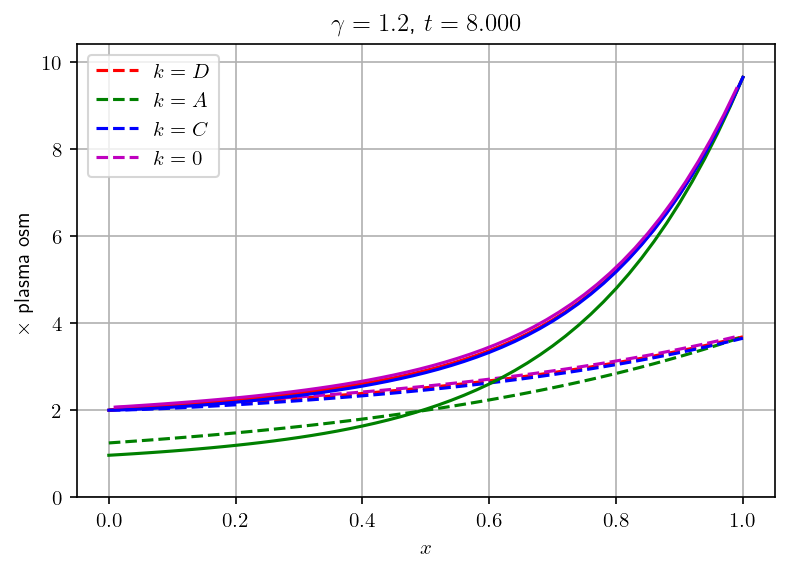

In [10]:
fig, ax = plt.subplots()
plt.rcParams['text.usetex'] = True
fig.set_facecolor('white')
ax.grid(True, which='both')
N = 50
dx = 1/N
x = np.linspace(0,1,num=N+1)
x_avg = np.linspace(dx/2,1-dx/2,num=N)

y_stb = np.load('dynamic_stable_v2.npy')
q_D_stb = y_stb[:,:N+1]
q_C_stb = y_stb[:,(N+1):2*(N+1)]
q_0_stb = y_stb[:,2*(N+1):3*(N+1)]
s_D_stb = y_stb[:,3*(N+1):4*(N+1)]
s_A_stb = y_stb[:,4*(N+1):5*(N+1)]
u_C_stb = y_stb[:,5*(N+1):6*(N+1)]
s_0_stb = y_stb[:,6*(N+1):7*N+6]
u_0_stb = y_stb[:,7*N+6:8*N+6]
q_A_stb = y_stb[:,8*N+6:]

y_usb = np.load('./conv_to_third_ss.npy')
q_D_usb = y_usb[:,:N+1]
q_C_usb = y_usb[:,(N+1):2*(N+1)]
q_0_usb = y_usb[:,2*(N+1):3*(N+1)]
s_D_usb = y_usb[:,3*(N+1):4*(N+1)]
s_A_usb = y_usb[:,4*(N+1):5*(N+1)]
u_C_usb = y_usb[:,5*(N+1):6*(N+1)]
s_0_usb = y_usb[:,6*(N+1):7*N+6]
u_0_usb = y_usb[:,7*N+6:8*N+6]
q_A_usb = y_usb[:,8*N+6:]

osm_D_stb = 2*s_D_stb[:16001,:]
osm_A_stb = 2*s_A_stb[:16001,:]
osm_C_stb = u_C_stb[:16001,:]
osm_0_stb = 2*s_0_stb[:16001,:]+u_0_stb[:16001,:]

osm_D_usb = 2*s_D_usb[:16001,:]
osm_A_usb = 2*s_A_usb[:16001,:]
osm_C_usb = u_C_usb[:16001,:]
osm_0_usb = 2*s_0_usb[:16001,:]+u_0_usb[:16001,:]

ax.set_ylim(0, np.amax(osm_0_usb)+1)

line1_stb, = ax.plot(x, osm_D_stb[0,:], 'r--', label=r'$k=D$')
line2_stb, = ax.plot(x, osm_A_stb[0,:], 'g--', label=r'$k=A$')
line3_stb, = ax.plot(x, osm_C_stb[0,:], 'b--', label=r'$k=C$')
line4_stb, = ax.plot(x_avg, osm_0_stb[0,:], 'm--', label=r'$k=0$')
line1_usb, = ax.plot(x, osm_D_usb[0,:], color = "r")
line2_usb, = ax.plot(x, osm_A_usb[0,:], color = "g")
line3_usb, = ax.plot(x, osm_C_usb[0,:], color = "b")
line4_usb, = ax.plot(x_avg, osm_0_usb[0,:], color = "m")

def update(num, x, x_avg, y1_stb, y2_stb, y3_stb, y4_stb, y1_usb, y2_usb, y3_usb, y4_usb, line1_stb, line2_stb, line3_stb, line4_stb, line1_usb, line2_usb, line3_usb, line4_usb):
    line1_stb.set_data(x, y1_stb[20*num,:])
    line2_stb.set_data(x, y2_stb[20*num,:])
    line3_stb.set_data(x, y3_stb[20*num,:])
    line4_stb.set_data(x_avg, y4_stb[20*num,:])
    line1_usb.set_data(x, y1_usb[100*num,:])
    line2_usb.set_data(x, y2_usb[100*num,:])
    line3_usb.set_data(x, y3_usb[100*num,:])
    line4_usb.set_data(x_avg, y4_usb[100*num,:])
    ax.set_title(r'$\gamma = 1.2$, $t={0:.3f}$'.format(100*num*0.0005))
    return [line1_stb, line2_stb, line3_stb, line4_stb, line1_usb, line2_usb, line3_usb, line4_usb]

ax.legend()
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$\times$ plasma osm')

# ani = animation.FuncAnimation(fig, update, frames=1601, fargs=[x_avg, osm_D, osm_A, osm_C, osm_0, line1, line2, line3, line4],
#                   interval=100, blit=True)

# plt.show()
# plt.rcParams["animation.html"] = "jshtml"
ani = animation.FuncAnimation(fig, update, frames=161, fargs=[x, x_avg, osm_D_stb, osm_A_stb, osm_C_stb, osm_0_stb, osm_D_usb, osm_A_usb, osm_C_usb, osm_0_usb, line1_stb, line2_stb, line3_stb, line4_stb, line1_usb, line2_usb, line3_usb, line4_usb],
                  interval=20, blit=True)
from IPython.display import HTML
# HTML(ani.to_html5_video())
display(HTML(ani.to_jshtml()))
ani.save('bistability.gif')